In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns

import xarray as xr
import rioxarray
import rasterio
import richdem as rd
#import xdem
import cartopy.crs as ccrs
from pyproj import CRS

from osgeo import gdal
import inspect
import os

import random
from scipy.spatial import distance

# DTM attributes

In [95]:
# function for computing terrain attributes (slope, aspect, profile curvature)

def compute_terrainattr(ds, attr='slope_degrees', method=None):

    dem = rd.rdarray(ds.values, no_data=-9999)
    dem.projection = ds.rio.crs.to_string()
    dem.geotransform = ds.rio.transform().to_gdal()

    if method == None:
        att = rd.TerrainAttribute(dem, attrib=attr)
        print (f'{attr} calculated')
    elif method == 'D8':
        dem = rd.FillDepressions(dem, epsilon=True, in_place=False)
        print ('depressions in dem filled')
        att = rd.FlowAccumulation(dem, method=method)
        print (f'flow accumulation calculated with method {method}')
        
    return att

In [90]:
fn_in = 'data_in/dtm.tif'
fn_out = 'data_out/dtm_attr_noflowacc.nc'

if not os.path.exists(fn_out):
    
    print ('assigning DTM attributes, this takes some time')
    
    # open DTM
    dtm = rioxarray.open_rasterio(fn)

    # reorganise array
    dtm = xr.Dataset({'elevation': dtm[0]})
    
    # compute terrain attributes from DTM
    slope = compute_terrainattr(dtm['elevation'], 'slope_degrees')
    profcurv = compute_terrainattr(dtm['elevation'], 'profile_curvature')
    aspect = compute_terrainattr(dtm['elevation'], 'aspect')
    #flowacc = compute_terrainattr(dtm['elevation'], method='D8')

    # redefine aspect
    aspect_sin = np.sin(np.deg2rad(aspect))
    aspect_cos = np.cos(np.deg2rad(aspect))

    # reorganise array
    dtm['slope'] = (('y', 'x'), slope)
    dtm['profcurv'] = (('y', 'x'), profcurv)
    dtm['aspect_sin'] = (('y', 'x'), aspect_sin)
    dtm['aspect_cos'] = (('y', 'x'), aspect_cos)
    #dtm['flowacc'] = (('y', 'x'), flowacc)
    
    # define TPI
    if not os.path.exists('data_out/TPI.tif'):
        tpi = gdal.DEMProcessing('data_out/TPI.tif', gdal.Open(fn_in), 'TPI', computeEdges=True)
    tpi_data = rioxarray.open_rasterio('data_out/TPI.tif')
    dtm['tpi'] = tpi_data[0] # include TPI in DTM attributes
    
    # define TRI
    if not os.path.exists('data_out/TRI.tif'):
        tri = gdal.DEMProcessing('data_out/TRI.tif', gdal.Open(fn_in), 'TRI', computeEdges=True)
    tri_data = rioxarray.open_rasterio('data_out/TRI.tif')
    dtm['tri'] = tri_data[0] # include TRI in DTM attributes

    # save dtm attributes to new tif file
    dtm.to_netcdf('data_out/dtm_attr_noflowacc.nc')
    
else:
    
    print ('opening DTM attributes')
    
    dtm = xr.open_dataset('data_out/dtm_attr_noflowacc.nc')

opening DTM attributes


In [2]:
dtm_flowacc = xr.open_dataset('data_out/dtm_attr_flowacc.nc')
dtm_flowacc

<xarray.Dataset> Size: 252MB
Dimensions:      (x: 3002, y: 3002)
Coordinates:
    band         int64 8B ...
  * x            (x) float64 24kB 3.543e+04 3.543e+04 ... 5.043e+04 5.043e+04
  * y            (y) float64 24kB 6.711e+06 6.711e+06 ... 6.696e+06 6.696e+06
Data variables:
    spatial_ref  int64 8B ...
    elevation    (y, x) float64 72MB ...
    slope        (y, x) float32 36MB ...
    flowacc      (y, x) float64 72MB ...
    spi          (y, x) float64 72MB ...

In [ ]:
# add FLOW_ACC and SPI to DTM attributes

if not os.path.exists('data_out/dtm_attr_flowacc.nc'):
    
    flowacc = compute_terrainattr(dtm['elevation'], method='D8')
    print ('flow accumulation calculated')
    dtm['flowacc'] = (('y', 'x'), flowacc)

    
    
    def calculate_spi(flow_acc_block, slope_block):
        return np.log((flow_acc_block*1*1 + 0.001) * np.tan(slope_block + 0.001))
        
    spi = calculate_spi(flowacc, dtm['slope']*np.pi/180)
    print ('spi calculated')
    dtm['spi'] = (('y', 'x'), spi)
    
    # save flowacc and spi attributes
    dtm[['elevation', 'slope', 'flowacc','spi']].to_netcdf('data_out/dtm_attr_flowacc.nc')
    print ('flowacc and spi attributes saved to file')

else:
    print ('opening and assigning FLOW_ACC and SPI')
    dtm_flowacc = xr.open_dataset('data_out/dtm_attr_flowacc.nc')
    dtm['flowacc'] = dtm_flowacc['flowacc']
    dtm['spi'] = dtm_flowacc['spi']
    #dtm = dtm[['slope']]

depressions in dem filled



A Priority-Flood+Epsilon
C Barnes, R., Lehman, C., Mulla, D., 2014. Priority-flood: An optimal depression-filling and watershed-labeling algorithm for digital elevation models. Computers & Geosciences 62, 117–127. doi:10.1016/j.cageo.2013.04.024

c topology = D8
p Setting up boolean flood array matrix...
p Adding cells to the priority queue...
p Performing Priority-Flood+Epsilon...
t succeeded in 2086.12 s                      ] (0% - infs - 1 threads)eads)
m Cells processed = 3888252004
m Cells in pits = 209168019


In [92]:
# assign projected coordinate system
dtm = dtm.rio.write_crs('EPSG:25833')

dtm.rio.crs

CRS.from_wkt('PROJCS["ETRS89 / UTM zone 33N",GEOGCS["ETRS89",DATUM["European_Terrestrial_Reference_System_1989",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6258"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4258"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",15],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","25833"]]')

# Forest

In [11]:
def get_variable_name(var):
    callers_local_vars = inspect.currentframe().f_back.f_locals.items()
    return [name for name, val in callers_local_vars if val is var][0]

In [13]:
if not os.path.exists('data_out/forest.nc'):
    
    print ('assigning forest attributes')
    
    # load forest data
    
    treetype = rioxarray.open_rasterio('data_in/SRRTRESLAG.tif')
    canopy = rioxarray.open_rasterio('data_in/SRRKRONEDEK.tif')
    treeheight = rioxarray.open_rasterio('data_in/SRRMHOYDE.tif')
    treenumber = rioxarray.open_rasterio('data_in/SRRTREANTALL.tif')
    treevolume = rioxarray.open_rasterio('data_in/SRRVOLMB.tif')
    #biomass = rioxarray.open_rasterio('data_in/SRBMO.tif')

    # reorganising array
    #dtm_data = xr.Dataset({'elevation': dtm_data[0]})
    
    
    
    # double-check CRS
    
    if dtm.rio.crs == treetype.rio.crs == canopy.rio.crs:
        print ('CRS are equal.')
        crs = dtm.rio.crs
    else:
        print ('DTM: ', dtm.rio.crs)
        print ('TREETYPE: ', treetype.rio.crs)
        print ('CANOPY: ', canopy.rio.crs)
        raise ValueError("CRS are not equal.")
        
        
        
    # assign and save forest attributes
        
    forest = xr.Dataset()

    for var in [treetype, canopy, treeheight, treenumber, treevolume]:
        print (get_variable_name(var))
        forest[get_variable_name(var)] = var[0].where((var.x >= dtm['x'].min()) & (var.y >= dtm['y'].min()) 
                                        & (var.x <= dtm['x'].max()) & (var.y <= dtm['y'].max()), drop=True)#})
        
    forest.to_netcdf('data_out/forest.nc')
    
else:
    
    print ('opening forest attributes')
    
    forest = xr.open_dataset('data_out/forest.nc')

opening forest attributes


# Forest loss

In [14]:
if not os.path.exists('data_out/forestloss.nc'):
    
    print ('assigning forest loss attributes')
    
    fl1 = rioxarray.open_rasterio('data_in/forestloss/Hans_GFC-2022_lossyear01.tif')
    fl2 = rioxarray.open_rasterio('data_in/forestloss/Hans_GFC-2022_lossyear02.tif')
    
    fl1 = fl1.rio.reproject(CRS.from_epsg(25833))
    fl2 = fl2.rio.reproject(CRS.from_epsg(25833))
    
    forestloss = xr.concat([fl1, fl2], dim="x")
    forestloss = forestloss[0].where((forestloss.x >= dtm['x'].min()) & (forestloss.y >= dtm['y'].min()) 
                               & (forestloss.x <= dtm['x'].max()) & (forestloss.y <= dtm['y'].max()), drop=True)
    
    forestloss.to_netcdf('data_out/forestloss.nc')
    
else:
    
    print ('opening forest loss attributes')
    
    forestloss = xr.open_dataset('data_out/forestloss.nc')

opening forest loss attributes


# Landforms

In [15]:
if not os.path.exists('data_out/landforms.nc'):
    
    print ('defining landform attributes')
    
    tpi300 = rioxarray.open_rasterio('data_in/tpi300_stdi.tif')
    tpi2000 = rioxarray.open_rasterio('data_in/tpi2000_stdi.tif')
    
    tpi300 = tpi300.where(tpi300 != -2147483648, np.nan)
    tpi2000 = tpi2000.where(tpi2000 != -2147483648, np.nan)
    
    landforms = xr.full_like(tpi300, np.nan)
    
    conditions = [
        (((tpi300 > -100) & (tpi300 < 100)) & ((tpi2000 > -100) & (tpi2000 < 100)) & (dtm['slope'] <= 5), 5),
        (((tpi300 > -100) & (tpi300 < 100)) & ((tpi2000 > -100) & (tpi2000 < 100)) & (dtm['slope'] > 5), 6), # >5 instead?
        (((tpi300 > -100) & (tpi300 < 100)) & (tpi2000 >= 100), 7),
        (((tpi300 > -100) & (tpi300 < 100)) & (tpi2000 <= -100), 4),
        ((tpi300 <= -100) & ((tpi2000 > -100) & (tpi2000 < 100)), 2),
        ((tpi300 >= 100) & ((tpi2000 > -100) & (tpi2000 < 100)), 9),
        ((tpi300 <= -100) & (tpi2000 >= 100), 3),
        ((tpi300 <= -100) & (tpi2000 <= -100), 1),
        ((tpi300 >= 100) & (tpi2000 >= 100), 10),
        ((tpi300 >= 100) & (tpi2000 <= -100), 8)
    ]
    
    for condition, category in conditions:
        landforms = landforms.where(~condition, category)
        
    landforms = xr.Dataset({'landforms': landforms[0]})

    landforms.to_netcdf('data_out/landforms.nc')
    
else:
    
    print ('opening landform attributes')
    
    landforms = xr.open_dataset('data_out/landforms.nc')
    
landforms = landforms.rio.write_crs("EPSG:25833")

#landforms.rio.to_raster('landforms.tif', dtype='float32', nodata=np.nan)

opening landform attributes


# Ground water

In [16]:
print ('extracting ground water data')
    
groundwater = rioxarray.open_rasterio('data_in/grunnvann_normalized.tif')

#xx_gw, yy_gw = np.meshgrid(groundwater['x'], groundwater['y'])

groundwater = groundwater[0].where((groundwater.x >= dtm['x'].min()) & (groundwater.y >= dtm['y'].min()) 
                                 & (groundwater.x <= dtm['x'].max()) & (groundwater.y <= dtm['y'].max()), drop=True)

groundwater = xr.Dataset({'groundwater': groundwater})

extracting ground water data


# Precipitation

In [17]:
print ('extracting precipitation data')

relprecip = rioxarray.open_rasterio('data_in/hans3_rel_normal.tif')
relprecip = relprecip.where(relprecip > 0, np.nan)

precip = rioxarray.open_rasterio('data_in/hans_080823-100823.tif')
precip = precip.where(precip > 0, np.nan)

# define x,y increments to include x,y values one cell outside the dtm

xstep = abs((relprecip['x'][1]-relprecip['x'][0]).values)
ystep = abs((relprecip['y'][1]-relprecip['y'][0]).values)

# extract subset similar to dtm domain

relprecip = relprecip[0].where((relprecip.x >= dtm['x'].min()-xstep) & (relprecip.y >= dtm['y'].min()-ystep) 
                             & (relprecip.x <= dtm['x'].max()+xstep) & (relprecip.y <= dtm['y'].max()+ystep), drop=True)
relprecip = xr.Dataset({'relprecip': relprecip})

precip = precip[0].where((precip.x >= dtm['x'].min()-xstep) & (precip.y >= dtm['y'].min()-ystep) 
                       & (precip.x <= dtm['x'].max()+xstep) & (precip.y <= dtm['y'].max()+ystep), drop=True)
precip = xr.Dataset({'precip': precip})

extracting precipitation data


# Assign attributes to landslide points and non-landslide points

### Landslide points first

In [18]:
# apply attributes to landslide df

def get_attr_for_coords(x, y, dtm, attr):
    att = dtm[attr].sel(x=x, y=y, method='nearest').values
    return att

In [50]:
if not os.path.exists('data_out/landslide_attributes.csv'):
    
    print ('assigning landslide attributes')
    
    # assign attributes necessary for creating control points

    landslide_points = pd.read_csv('data_in/landslide_attributes.csv')
    
    for attr in ['elevation','slope']:
        landslide_points[attr] = landslide_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], dtm, attr=attr), axis=1)

    landslide_points['relprecip'] = landslide_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], relprecip, attr='relprecip'), axis=1)

    # save minimised landslide attributes for definition of control points later
    
    if not os.path.exists('data_out/landslide_attributes_for_control_points.csv'):
        landslide_points.to_csv('data_out/landslide_attributes_for_control_points.csv', index=False)

    
    
    # assign other attributes

    for attr in ['profcurv', 'aspect_sin', 'aspect_cos', 'tri', 'tpi']:
        landslide_points[attr] = landslide_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], dtm, attr=attr), axis=1)

    #for attr in ['spi', 'flowacc']:
    #    landslide_points[attr] = landslide_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], dtm_flowacc, attr=attr), axis=1)

    for attr in ['canopy', 'treetype', 'treeheight', 'treenumber', 'treevolume']:
        landslide_points[attr] = landslide_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], forest, attr=attr), axis=1)

    landslide_points['groundwater'] = landslide_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], groundwater, attr='groundwater'), axis=1)
    landslide_points['precip'] = landslide_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], precip, attr='precip'), axis=1)
    
    landslide_points['landforms'] = landslide_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], landforms, attr='landforms'), axis=1)
    
    landslide_points.replace(-9999, np.nan, inplace=True)
    
    landslide_points.to_csv('data_out/landslide_attributes.csv', index=False)
    
else:
    
    print ('opening landslide attributes')
    
    landslide_points = pd.read_csv('data_out/landslide_attributes.csv')

opening landslide attributes


In [51]:
landslide_points

,x,y,bedrock,deposit,soil,lu,elevation,slope,relprecip,profcurv,...,treetype,treeheight,treenumber,treevolume,groundwater,precip,flowacc,spi,twi,landforms
0,167684.092427,6.869836e+06,402.0,11.0,43.0,50.0,1145.344292,28.583145,217.73248,1.467115,...,NaN,NaN,NaN,NaN,95.0,128.7549,190.0,7.858630,9.073170,2.0
1,202368.366856,6.756325e+06,403.0,11.0,44.0,30.0,314.786168,31.026085,165.13690,1.768647,...,1.0,144.0,1293.0,246.0,95.0,149.2426,387.0,8.668939,9.685662,4.0
2,158702.483048,6.784227e+06,402.0,81.0,44.0,30.0,1116.340327,36.514240,162.49648,-3.432729,...,3.0,54.0,1466.0,29.0,75.0,151.0358,591.0,9.300054,9.901330,6.0
3,157124.804880,6.784814e+06,402.0,81.0,44.0,30.0,877.925037,28.470516,163.10579,0.879604,...,3.0,93.0,1622.0,75.0,95.0,150.2709,207.0,7.939639,9.163550,1.0
4,215783.821124,6.814926e+06,143.0,11.0,44.0,30.0,711.032180,39.339016,134.08630,-0.968584,...,2.0,121.0,1366.0,137.0,95.0,146.7150,207239.0,15.261599,15.659408,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,237604.732912,6.682559e+06,104.0,50.0,44.0,30.0,145.610114,27.848473,100.56454,-3.249871,...,1.0,159.0,1579.0,273.0,95.0,86.2700,21.0,5.625349,6.901448,6.0
567,195374.092170,6.892372e+06,403.0,12.0,44.0,30.0,657.761472,28.874530,184.74870,0.682395,...,1.0,133.0,1219.0,134.0,95.0,104.5866,1223.0,9.732733,10.923142,6.0
568,184470.181959,6.775512e+06,402.0,12.0,44.0,21.0,660.114141,27.523922,132.39777,-0.374506,...,NaN,NaN,NaN,NaN,95.0,114.9912,23.0,5.702553,7.006188,6.0
569,184485.636187,6.775494e+06,402.0,12.0,44.0,21.0,653.340420,24.726114,132.39777,-1.382138,...,NaN,NaN,NaN,NaN,95.0,114.9912,104.0,7.087826,8.638707,6.0


#### assign flowacc and SPI

In [52]:
def get_max_attr_for_coords(x, y, flowacc, attr):
    # Find the nearest x and y indices
    x_idx = np.abs(flowacc['x'] - x).argmin().item()
    y_idx = np.abs(flowacc['y'] - y).argmin().item()

    # Get the indices for the 5x5 grid around (x_idx, y_idx)
    x_min = max(x_idx - 2, 0)
    x_max = min(x_idx + 2, len(flowacc['x']) - 1)
    y_min = max(y_idx - 2, 0)
    y_max = min(y_idx + 2, len(flowacc['y']) - 1)

    # Select the 5x5 grid
    grid_data = flowacc[attr].isel(x=slice(x_min, x_max + 1), y=slice(y_min, y_max + 1))

    # Compute the maximum value in this 5x5 grid
    max_val = grid_data.max().values

    return max_val

def calculate_spi(flow_acc, slope):
    return np.log((flow_acc*5*5) * np.tan(slope)) # 5 m x 5 m gives area of each cell ### why np.log?
#    return np.log((flow_acc*5*5 + 0.001) * np.tan(slope + 0.001)) # 5 m x 5 m gives area of each cell ### why np.log?

def calculate_twi(flow_acc, slope):
    return np.where(slope > 0, np.log((flow_acc*5*5) / np.tan(slope)), 0) ###### *25???
    #return np.log((flow_acc + 0.001) / np.tan(slope + 0.001)) #######################
#ln((flowacc+1)/(tan(slope))

In [59]:
#landslide_points = pd.read_csv('landslide_attributes.csv')

for attr in ['flowacc']:
    if attr not in landslide_points.columns:

        print (f'adding {attr}')
        
        flowacc = rioxarray.open_rasterio('data_in/flowacc_fill05.tif')
        flowacc = xr.Dataset({'flowacc': flowacc[0]})
        
        landslide_points[attr] = landslide_points.apply(lambda row: get_max_attr_for_coords(row['x'], row['y'], flowacc, attr=attr), axis=1)

if 'spi' not in landslide_points.columns:
    print (f'adding spi')
    landslide_points['spi'] = landslide_points.apply(lambda row: calculate_spi(row['flowacc'], row['slope']*np.pi/180), axis=1)
    #calculate_spi(landslide_points['flowacc'], landslide_points['slope']*np.pi/180)
    
if 'twi' not in landslide_points.columns:
    print (f'adding twi')
    landslide_points['twi'] = landslide_points.apply(lambda row: calculate_twi(row['flowacc'], row['slope']*np.pi/180), axis=1)
    #calculate_twi(landslide_points['flowacc'], landslide_points['slope']*np.pi/180)

In [109]:
for attr in landslide_points.columns:
    print (attr, '    ', landslide_points[attr].min(), landslide_points[attr].max())

x      68925.43555966351 259681.7824933604
y      6682558.593307994 6965167.647639015
bedrock      102.0 456.0
deposit      11.0 130.0
soil      41.0 44.0
lu      21.0 50.0
elevation      50.62329238891601 1613.8903564453126
slope      18.589567 60.849655
relprecip      79.671776 234.81865
profcurv      -27.160654 19.788979
aspect_sin      -0.999972 0.9999997
aspect_cos      -0.9999999 0.9999932
tri      4.125178813934326 23.55914306640625
tpi      -2.17498779296875 2.55279541015625
canopy      0.0 100.0
treetype      1.0 3.0
treeheight      0.0 292.0
treenumber      0.0 3021.0
treevolume      0.0 699.0
groundwater      0.0 95.0
precip      47.8032 170.3326
flowacc      4.0 1796072.0
spi      4.18826475780552 17.305726103852717
twi      4.925861055608789 17.934250778138875


In [108]:
#landslide_points.to_csv('landslide_attributes.csv', index=False)

### now, let's define control points

#### - this requires few variables in the memory

In [61]:
# control points are defined using similar elevation, slope and relative precipitation as landslide points
# let's minmise the landslide points with only the relevant attributes

landslide_points = pd.read_csv('data_out/landslide_attributes_for_control_points.csv')
#landslide_points = landslide_points[['x','y','elevation','slope','relprecip']]
landslide_points

,x,y,elevation,slope,relprecip
0,167684.092427,6.869836e+06,1145.344292,28.583145,217.73248
1,202368.366856,6.756325e+06,314.786168,31.026085,165.13690
2,158702.483048,6.784227e+06,1116.340327,36.514240,162.49648
3,157124.804880,6.784814e+06,877.925037,28.470516,163.10579
4,215783.821124,6.814926e+06,711.032180,39.339016,134.08630
...,...,...,...,...,...
566,237604.732912,6.682559e+06,145.610114,27.848473,100.56454
567,195374.092170,6.892372e+06,657.761472,28.874530,184.74870
568,184470.181959,6.775512e+06,660.114141,27.523922,132.39777
569,184485.636187,6.775494e+06,653.340420,24.726114,132.39777


In [62]:
# merge relprecip into dtm to find appropriate mask for selection of control points

relprecip_regridded = relprecip.interp_like(dtm, method="nearest")

if 'spatial_ref' in relprecip_regridded.coords:
    relprecip_regridded = relprecip_regridded.drop_vars('spatial_ref')
    
dtm['relprecip'] = relprecip_regridded['relprecip']

In [64]:
# minimise dtm to necessary variables
dtm = dtm[['elevation', 'slope', 'relprecip']]

In [65]:
# flatten arrays

x, y = np.meshgrid(dtm['x'].values, dtm['y'].values)

x_data = x.flatten()#.astype(np.float16).copy()
y_data = y.flatten()#.astype(np.float16).copy()
print ('flattened x,y arrays ready')

flattened x,y arrays ready


In [66]:
elevation_data = dtm['elevation'].values.flatten().astype(np.float16)
slope_data = dtm['slope'].values.flatten().astype(np.float16)
relprecip_data = dtm['relprecip'].values.flatten().astype(np.float16)
print ('all flattened arrays ready')

dtm_df = pd.DataFrame({
    'x': x_data,
    'y': y_data,
    'elevation': elevation_data,
    'slope': slope_data,
    'relprecip': relprecip_data
})
print ('dtm_df defined')

all flattened arrays ready
dtm_df defined


In [71]:
np.nanmax(dtm_df['elevation'])

2468.0

In [76]:
# delete previous variables to ensure enough memory
del x, y, x_data, y_data, elevation_data, slope_data, relprecip_data, dtm, relprecip_regridded
#del canopy, flowacc, forest, forestloss, groundwater, landforms, precip, relprecip, treeheight, treenumber, treetype, treevolume

In [77]:
# define area to get control points from

elevation_min = landslide_points['elevation'].min()
elevation_max = landslide_points['elevation'].max()
slope_min = landslide_points['slope'].min()
slope_max = landslide_points['slope'].max()
relprecip_min = landslide_points['relprecip'].min()
relprecip_max = landslide_points['relprecip'].max()

print (elevation_min, elevation_max, slope_min, slope_max, relprecip_min, relprecip_max)

mask_elevation = (dtm_df['elevation'] >= elevation_min) & (dtm_df['elevation'] <= elevation_max)
print ('elevation mask defined')
mask_slope = (dtm_df['slope'] >= slope_min) & (dtm_df['slope'] <= slope_max)
print ('slope mask defined')
mask_relprecip = (dtm_df['relprecip'] >= relprecip_min) & (dtm_df['relprecip'] <= relprecip_max)
print ('precip mask defined')

50.62329238891601 1613.8903564453126 18.589567 60.849655 79.671776 234.81865
elevation mask defined
slope mask defined
precip mask defined


In [78]:
# define sample of dtm that meets elevation, slope and relative precipitation criteria
masked_dtm_df = dtm_df[mask_elevation & mask_slope & mask_relprecip]

In [79]:
# define sample size and extract random subsample of dtm to get control points from
sample_size = len(landslide_points)
sampled_points = masked_dtm_df.sample(n=sample_size*1000, replace=True)

In [80]:
# double-check if sample with potential control points contains landslide points
matched_points = pd.merge(landslide_points, sampled_points, on=['x', 'y'])

if not matched_points.empty:
    print(f"Common rows found:\n{matched_points}")
else:
    print("No common rows found.")

No common rows found.


In [81]:
# normalise elevation, slope and relative precipitation
    
landslide_list = landslide_points[['elevation', 'slope', 'relprecip']].copy()
landslide_list['elevation'] /= elevation_max
landslide_list['slope'] /= slope_max
landslide_list['relprecip'] /= relprecip_max
landslide_list = landslide_list.values

sampled_list = sampled_points[['elevation', 'slope', 'relprecip']].copy()
sampled_list['elevation'] /= elevation_max
sampled_list['slope'] /= slope_max
sampled_list['relprecip'] /= relprecip_max
sampled_list = sampled_list.values

In [85]:
# define function which finds the points in the sample that are 
# closest to the landslide points in the 3D normalised elevation-slope-relprecip space

def find_closest_points(landslide_list, sampled_list):
    perc = int(.01*len(sampled_list))
    print (perc)
    indices = []
    used_indices = set()
    
    # Loop through each point in the landslide_list
    for point in landslide_list:
        # Calculate the distance from the point to all points in the sampled_list
        distances = distance.cdist([point], sampled_list, 'euclidean')[0]  # Use [0] since cdist returns a 2D array
        sorted_indices = np.argsort(distances)  # Get indices that would sort the distances
        #print (sorted_indices[:perc])
        random_indices = sorted_indices[:perc]
        random.shuffle(random_indices)
        #print (random_indices)
        
        # Find the first unused index in the sorted order of distances
        for idx in random_indices: #sorted_indices:
            if idx not in used_indices:
                min_index = idx
                break
        
        # Append the index of the closest unused point from the sampled_list to the result
        indices.append(min_index)
        used_indices.add(min_index)
    
    return indices

In [86]:
# find closest points in sample to define control points
indices = find_closest_points(landslide_list, sampled_list)
control_points = sampled_points.iloc[indices]

5710


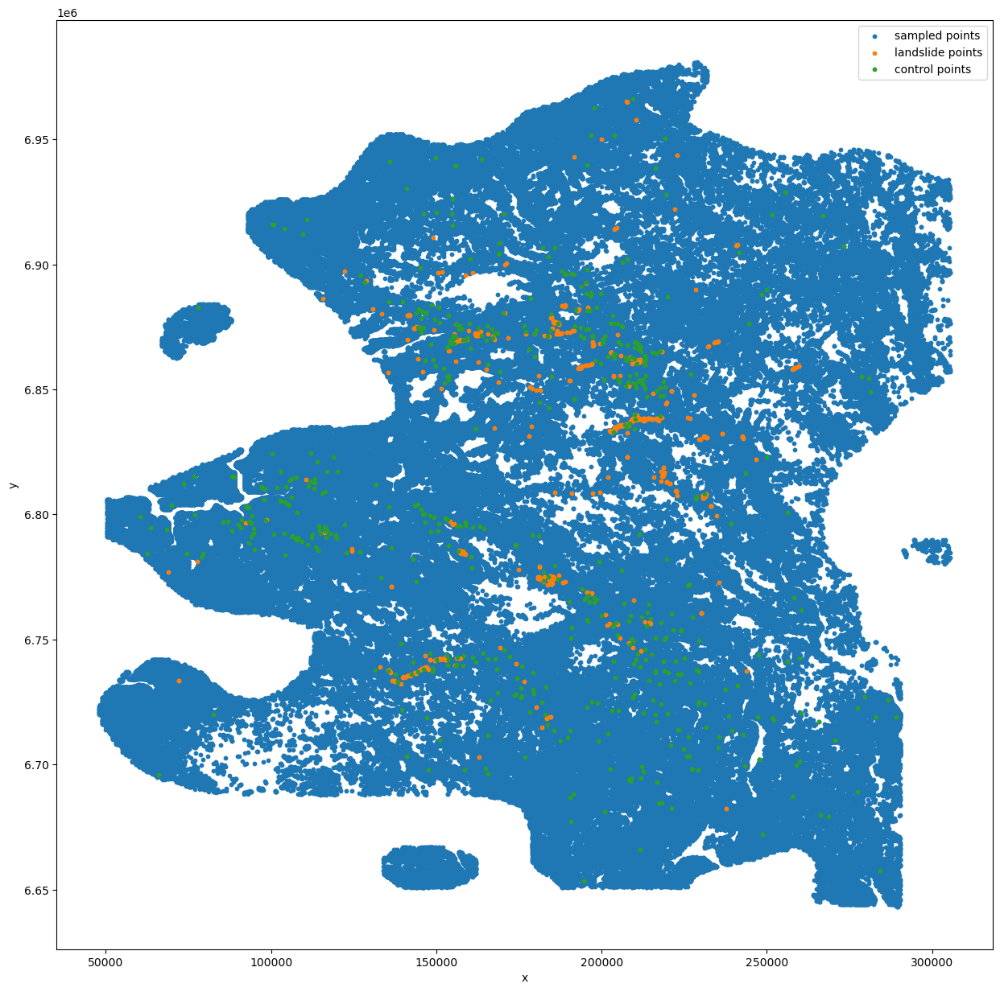

In [87]:
# plot sample together with landslide points and chosen control points

size = 10

fig,ax = plt.subplots(figsize=(15,15))

plt.scatter(sampled_points['x'], sampled_points['y'], size, label='sampled points')
plt.scatter(landslide_points['x'], landslide_points['y'], size, label='landslide points')
plt.scatter(control_points['x'], control_points['y'], size, label='control points')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()

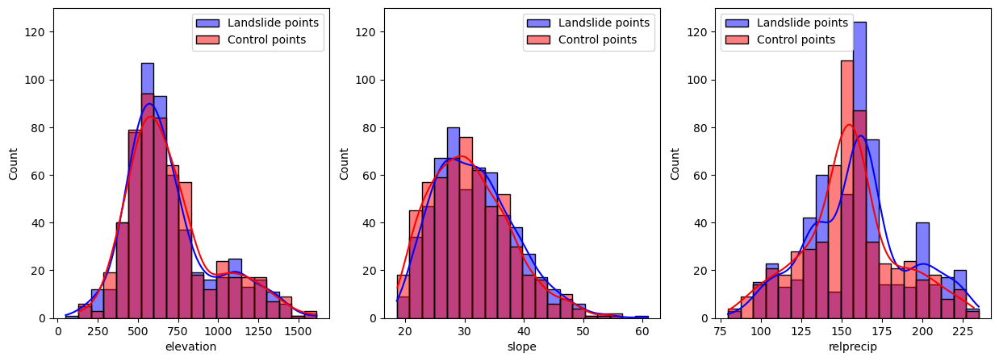

In [88]:
# plot distribution of elevation, slope and relprecip for landslide points and control points

stat = 'count' #'probability'#
nbins = 20

fig, ax = plt.subplots(1, 3, figsize=(15, 5))

sns.histplot(landslide_points['elevation'], kde=True, ax=ax[0], color='blue', bins=nbins, binrange=(elevation_min,elevation_max), stat=stat, label='Landslide points')
#sns.histplot(sampled_points['elevation'], kde=True, ax=ax[0], color='green', bins=nbins, binrange=(elevation_min,elevation_max), stat=stat, label='Sampled points')
sns.histplot(control_points['elevation'], kde=True, ax=ax[0], color='red', bins=nbins, binrange=(elevation_min,elevation_max), stat=stat, label='Control points')
ax[0].legend()
if stat == 'count':
    ax[0].set_ylim(0,130)

sns.histplot(landslide_points['slope'], kde=True, ax=ax[1], color='blue', bins=nbins, binrange=(slope_min,slope_max), stat=stat, label='Landslide points')
#sns.histplot(sampled_points['slope'], kde=True, ax=ax[1], color='green', bins=nbins, binrange=(slope_min,slope_max), stat=stat, label='Sampled points')
sns.histplot(control_points['slope'], kde=True, ax=ax[1], color='red', bins=nbins, binrange=(slope_min,slope_max), stat=stat, label='Control points')
ax[1].legend()
if stat == 'count':
    ax[1].set_ylim(0,130)

sns.histplot(landslide_points['relprecip'], kde=True, ax=ax[2], color='blue', bins=nbins, binrange=(relprecip_min,relprecip_max), stat=stat, label='Landslide points')
#sns.histplot(sampled_points['relprecip'], kde=True, ax=ax[2], color='green', bins=nbins, binrange=(relprecip_min,relprecip_max), stat=stat, label='Sampled points')
sns.histplot(control_points['relprecip'], kde=True, ax=ax[2], color='red', bins=nbins, binrange=(relprecip_min,relprecip_max), stat=stat, label='Control points')
ax[2].legend()
if stat == 'count':
    ax[2].set_ylim(0,130)

plt.show()

#plt.figure(figsize=(3, 5))
#sns.boxplot(data=landslide_points['elevation'])
#plt.show()

In [61]:
# save control points
control_points.to_csv('control_attributes.csv', index=False)


#### finally assign attributes to control points

In [ ]:
#control_points = pd.read_csv('control_attributes.csv')
control_points

In [41]:
#def get_attr_for_coords(x, y, dtm, attr):
#    att = dtm[attr].sel(x=x, y=y, method='nearest').values
#    return att

In [93]:

for attr in ['elevation','slope']:
    control_points[attr] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], dtm, attr=attr), axis=1)
    
control_points['relprecip'] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], relprecip, attr='relprecip'), axis=1)

for attr in ['profcurv', 'aspect_sin', 'aspect_cos', 'tri', 'tpi']:
    control_points[attr] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], dtm, attr=attr), axis=1)

for attr in ['canopy', 'treetype', 'treeheight', 'treenumber', 'treevolume']:
    control_points[attr] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], forest, attr=attr), axis=1)

control_points['groundwater'] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], groundwater, attr='groundwater'), axis=1)
    
control_points['precip'] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], precip, attr='precip'), axis=1)

for attr in ['flowacc']:
    control_points[attr] = control_points.apply(lambda row: get_max_attr_for_coords(row['x'], row['y'], flowacc, attr=attr), axis=1)

control_points['spi'] = control_points.apply(lambda row: calculate_spi(row['flowacc'], row['slope']*np.pi/180), axis=1)
control_points['twi'] = control_points.apply(lambda row: calculate_twi(row['flowacc'], row['slope']*np.pi/180), axis=1)

control_points['landforms'] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], landforms, attr='landforms'), axis=1)

control_points.to_csv('control_attributes.csv', index=False)

/tmp/ipykernel_422914/281066548.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  control_points[attr] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], dtm, attr=attr), axis=1)
/tmp/ipykernel_422914/281066548.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  control_points['relprecip'] = control_points.apply(lambda row: get_attr_for_coords(row['x'], row['y'], relprecip, attr='relprecip'), axis=1)
/tmp/ipykernel_422914/281066548.py:7: SettingWithCopyWarning: 
A value is trying t

KeyboardInterrupt: 

# figures

In [38]:
landforms = xr.open_dataset('data/landforms.nc')

In [68]:
#landforms['landforms']# = landforms['landforms'][0]

In [44]:
#landforms = landforms.drop_vars('__xarray_dataarray_variable__')
#landforms['landforms']

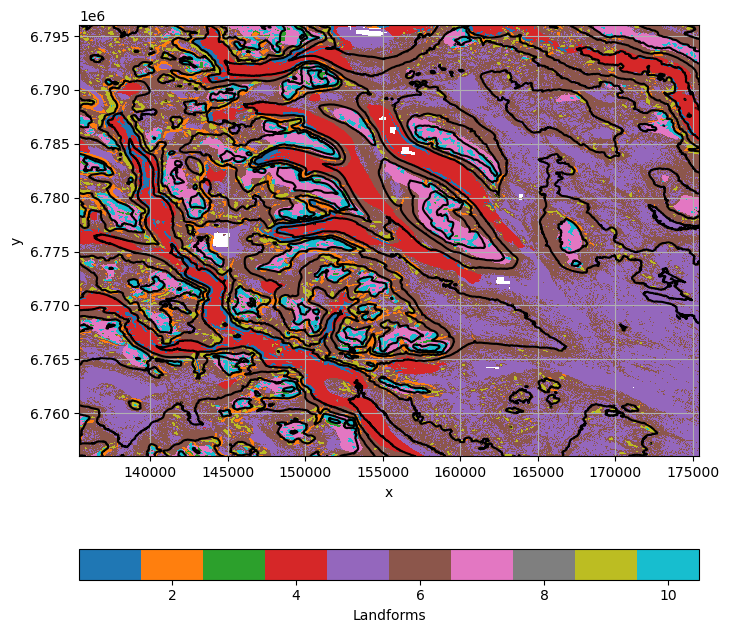

In [58]:
xx,yy = np.meshgrid(dtm['x'], dtm['y'])

indx = 100
indy = 10
xstart = 40000
xend = 48000
ystart = 20000
yend = 28000

xx = xx[xstart:xend, ystart:yend]
yy = yy[xstart:xend, ystart:yend]

plt.figure(figsize=(8, 8))
lf = plt.pcolormesh(xx, yy, landforms['landforms'].values[xstart:xend, ystart:yend], 
               vmin=0.5, vmax=10.5, cmap='tab10') #
plt.contour(xx, yy, dtm['elevation'].values[xstart:xend, ystart:yend],
            colors='k')#, cmap='terrain')
plt.colorbar(lf, orientation='horizontal', label='Landforms')
#plt.xlim(10e5, 1.5*10e5)
#plt.ylim(6.7*10e6, 6.8*10e6)
plt.xlabel('x')
plt.ylabel('y')
plt.grid()
plt.show()

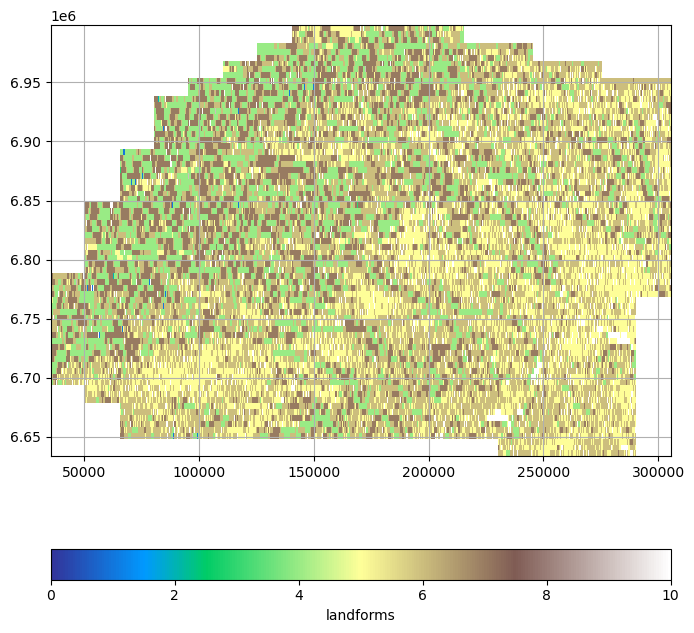

In [22]:
xx,yy = np.meshgrid(landforms['x'], landforms['y'])

indx = 100
indy = 10
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx[::indx][::indy], yy[::indx][::indy], landforms[0][::indx][::indy], vmin=0, vmax=10, cmap='terrain') #
plt.colorbar(orientation='horizontal', label='landforms')
plt.grid()
plt.show()

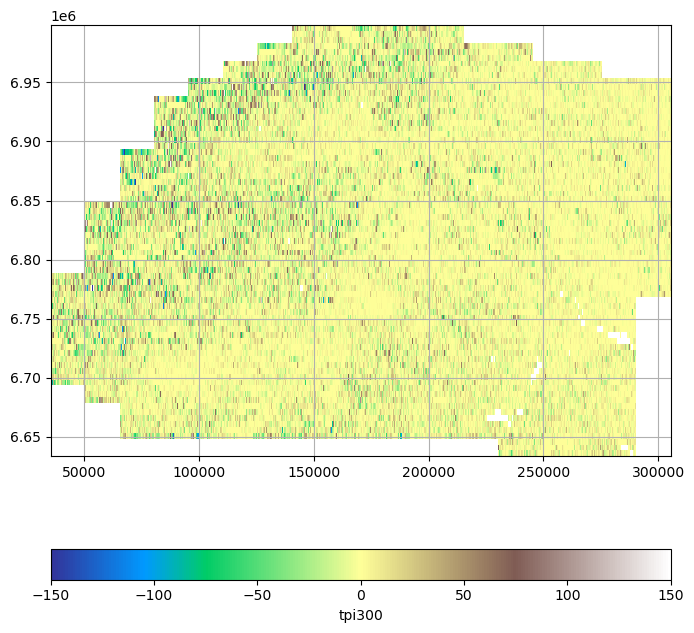

In [32]:
xx,yy = np.meshgrid(tpi300['x'], tpi300['y'])

indx = 100
indy = 10
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx[::indx][::indy], yy[::indx][::indy], tpi300[0][::indx][::indy], vmin=-150, vmax=150, cmap='terrain') #
plt.colorbar(orientation='horizontal', label='tpi300')
plt.grid()
plt.show()

In [ ]:
xx,yy = np.meshgrid(landforms['x'], landforms['y'])

ind = 10
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx[::ind][::ind], yy[::ind][::ind], landforms[0][::ind][::ind], cmap='terrain') #vmin=0, vmax=50, 
plt.colorbar(orientation='horizontal', label='landforms')
plt.grid()
plt.show()

In [13]:
#ds_masked_chunked = ds_filled.where(ds_filled['filled_dtm'] != -9999.)  

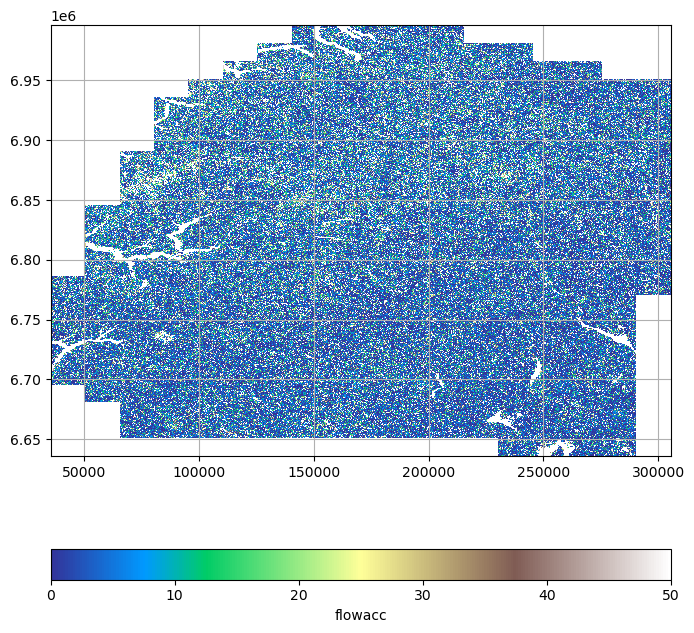

In [8]:
xx,yy = np.meshgrid(flowacc['x'], flowacc['y'])

ind = 10
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx[::ind][::ind], yy[::ind][::ind], flowacc['flowacc'][::ind][::ind], vmin=0, vmax=50, cmap='terrain')
plt.colorbar(orientation='horizontal', label='flowacc')
plt.grid()
plt.show()

In [17]:
ds_masked = ds_filled.where(ds_filled['filled_dtm'] != -9999.)  

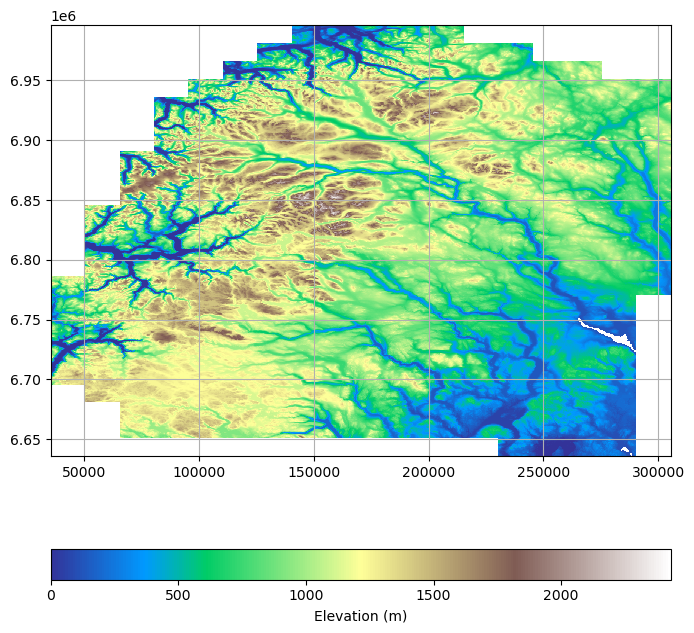

In [21]:
xx,yy = np.meshgrid(ds_filled['x'], ds_filled['y'])

ind = 10
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx[::ind][::ind], yy[::ind][::ind], ds_masked['filled_dtm'][::ind][::ind], cmap='terrain')
plt.colorbar(orientation='horizontal', label='Elevation (m)')
plt.grid()
plt.show()

In [71]:
xx,yy = np.meshgrid(dtm['x'], dtm['y'])

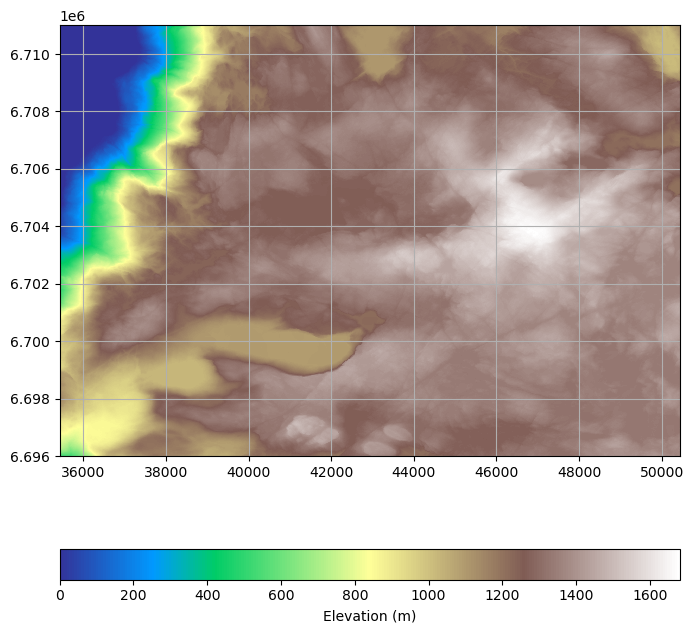

In [72]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['elevation'], cmap='terrain')
plt.colorbar(orientation='horizontal', label='Elevation (m)')
#plt.title("Downsampled DTM Visualization")
plt.grid()
plt.show()

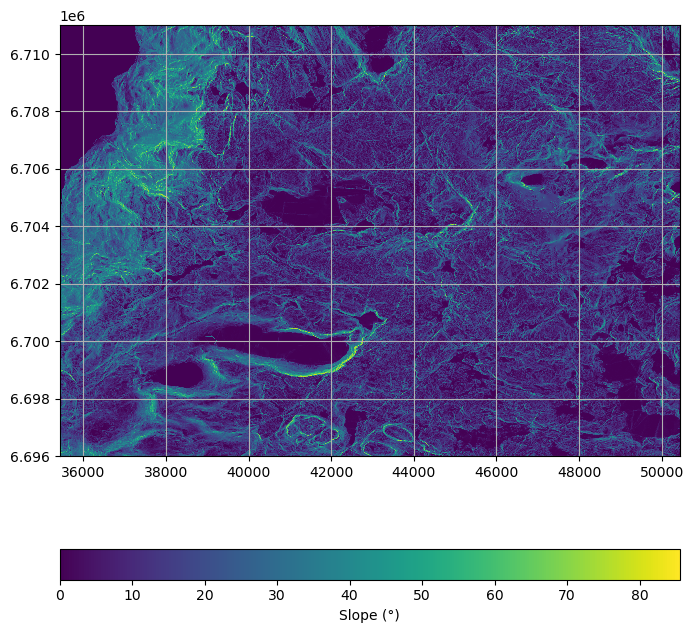

In [78]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['slope'])#, vmax=2, cmap='terrain')
plt.colorbar(orientation='horizontal', label='Slope (\u00b0)')
plt.grid()
plt.show()

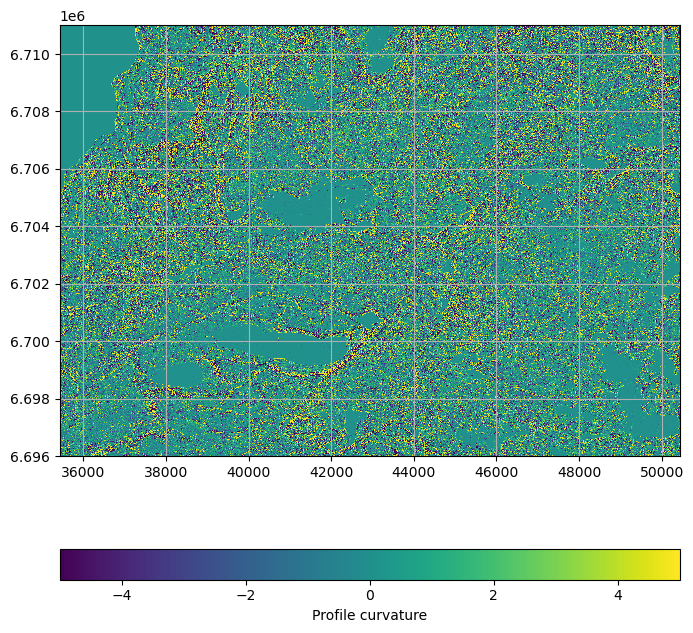

In [106]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['profcurv'], vmin=-5, vmax=5)
plt.colorbar(orientation='horizontal', label='Profile curvature')
plt.grid()
plt.show()

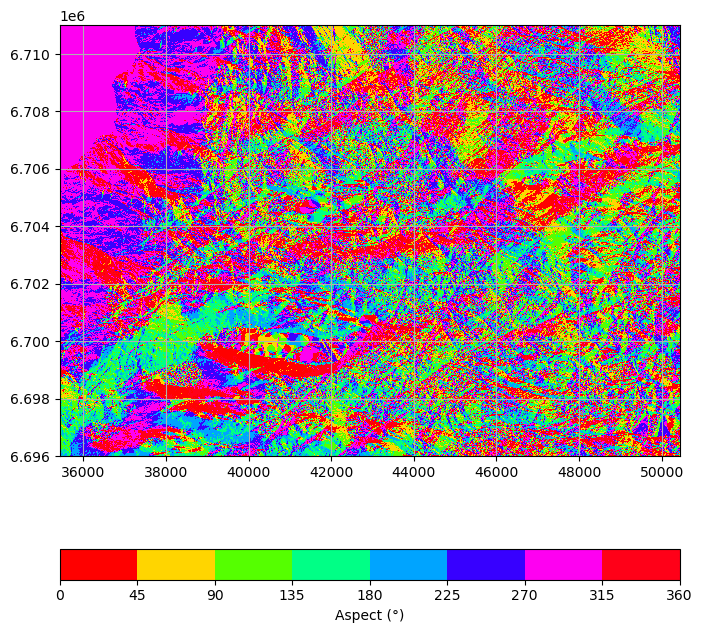

In [74]:
n_bins = 8
cmap = plt.get_cmap('hsv')
bounds = np.linspace(np.min(aspect), np.max(aspect), n_bins + 1)
norm = mcolors.BoundaryNorm(boundaries=bounds, ncolors=cmap.N)

plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, aspect, norm=norm, cmap=cmap)#twilight')
plt.colorbar(orientation='horizontal', label='Aspect (\u00b0)')
plt.grid()
plt.show()

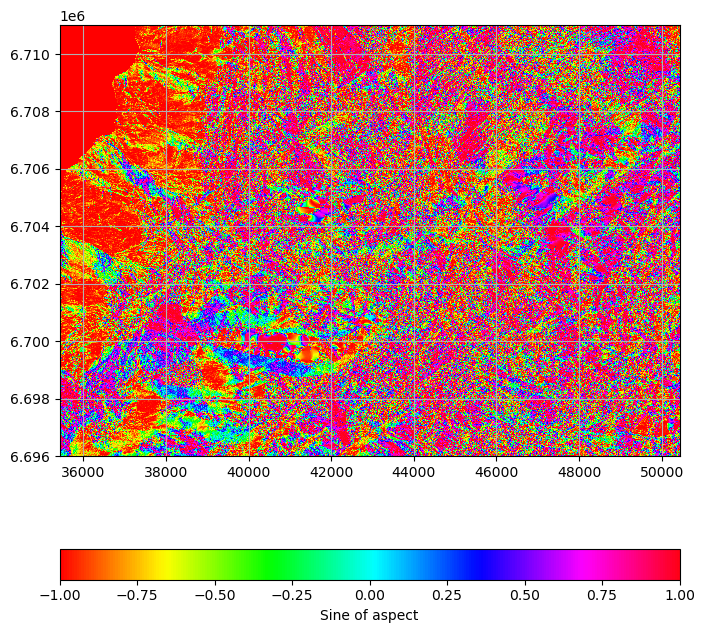

In [75]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['aspect_sin'], cmap=cmap)#twilight')
plt.colorbar(orientation='horizontal', label='Sine of aspect')
plt.grid()
plt.show()

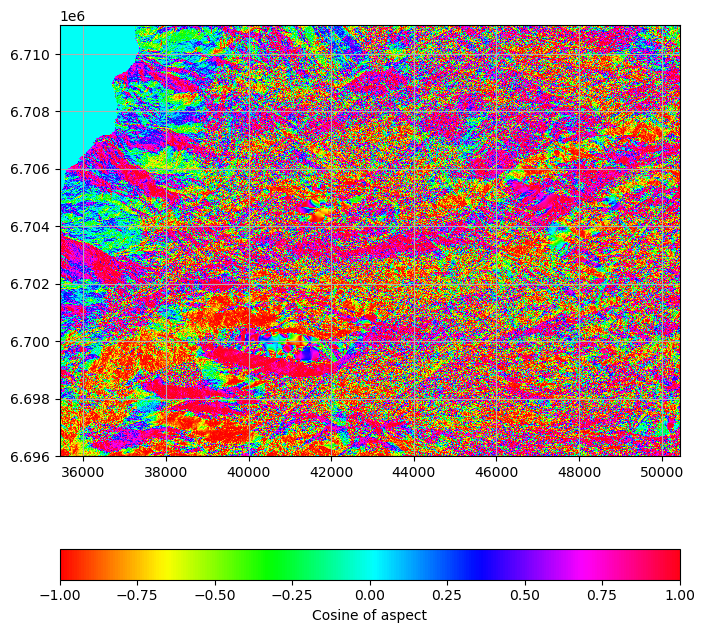

In [76]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['aspect_cos'], cmap=cmap)#twilight')
plt.colorbar(orientation='horizontal', label='Cosine of aspect')
plt.grid()
plt.show()

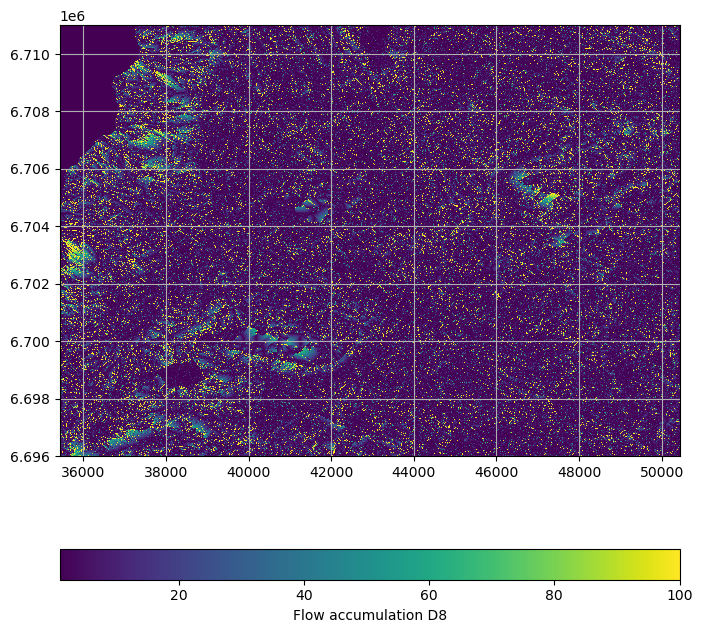

In [80]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['flowacc'], vmax=100, cmap='viridis')
plt.colorbar(orientation='horizontal', label='Flow accumulation D8')
plt.grid()
plt.show()

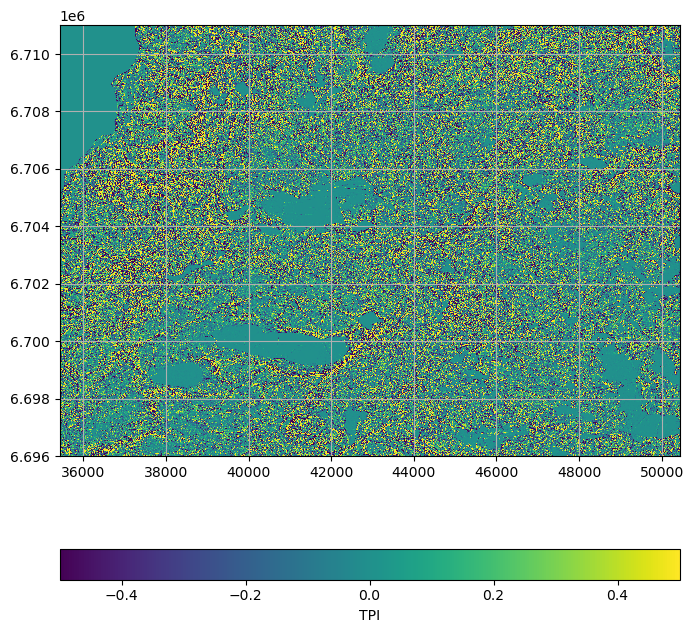

In [90]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['tpi'], vmin=-.5, vmax=.5)#, cmap='terrain')
plt.colorbar(orientation='horizontal', label='TPI')
plt.grid()
plt.show()

In [85]:
dtm['tpi'].min(), dtm['tpi'].max()

(<xarray.DataArray 'tpi' ()> Size: 4B
 array(-27.982788, dtype=float32)
 Coordinates:
     band         int64 8B 1
     spatial_ref  int64 8B 0,
 <xarray.DataArray 'tpi' ()> Size: 4B
 array(26.492065, dtype=float32)
 Coordinates:
     band         int64 8B 1
     spatial_ref  int64 8B 0)

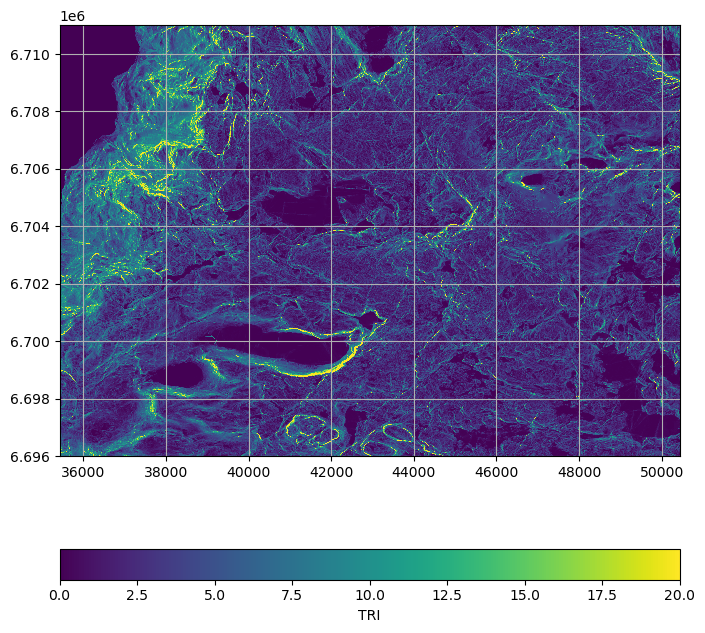

In [91]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['tri'], vmax=20)#, cmap='terrain')
plt.colorbar(orientation='horizontal', label='TRI')
plt.grid()
plt.show()

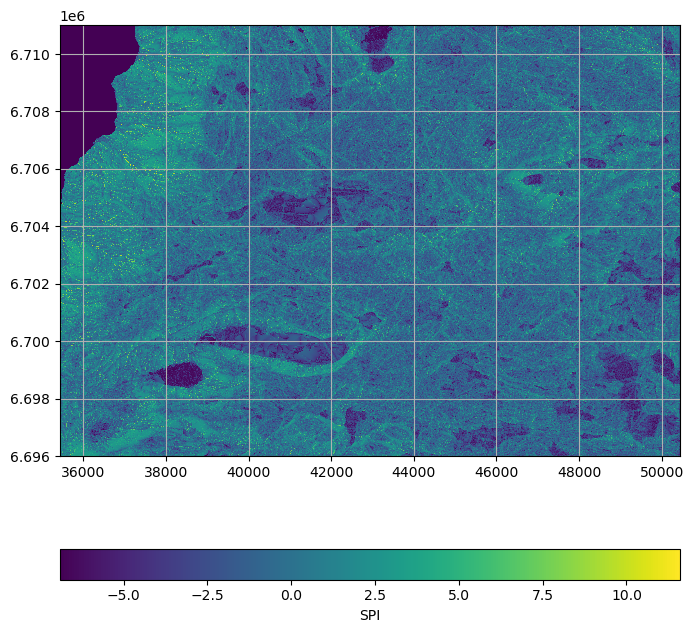

In [84]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx, yy, dtm['spi'])#, vmax=2, cmap='terrain')
plt.colorbar(orientation='horizontal', label='SPI')
plt.grid()
plt.show()

### plot treetype, canopy

In [32]:
forest = forest.where(forest != -9999, np.nan)

In [34]:
xx_sr, yy_sr = np.meshgrid(forest['x'], forest['y'])

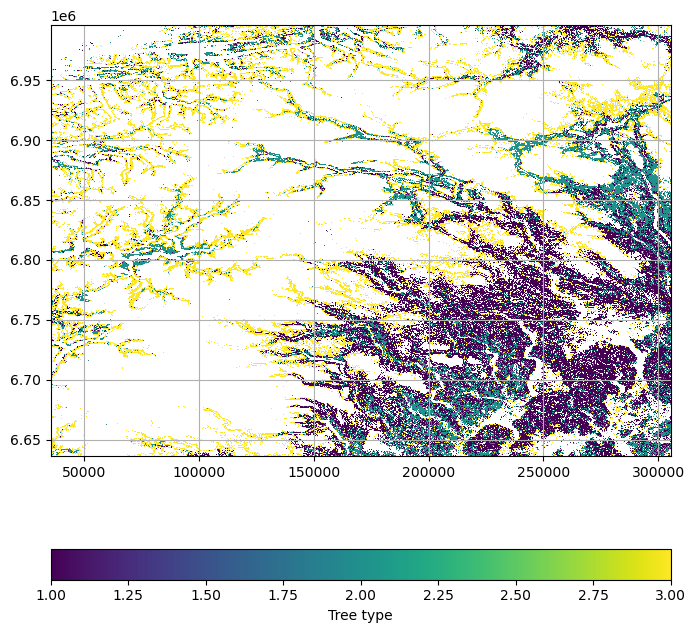

In [37]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx_sr, yy_sr, forest['treetype'])#, vmax=100, cmap='viridis')
plt.colorbar(orientation='horizontal', label='Tree type')
plt.grid()
plt.show()

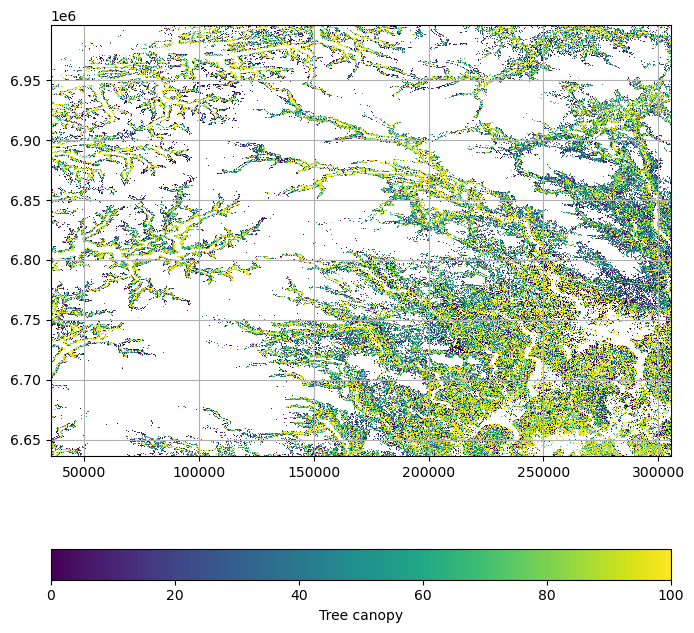

In [38]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx_sr, yy_sr, forest['canopy'])#, vmax=100, cmap='viridis')
plt.colorbar(orientation='horizontal', label='Tree canopy (%)')
plt.grid()
plt.show()

### plot ground water

In [95]:
xx_gw, yy_gw = np.meshgrid(groundwater['x'], groundwater['y'])

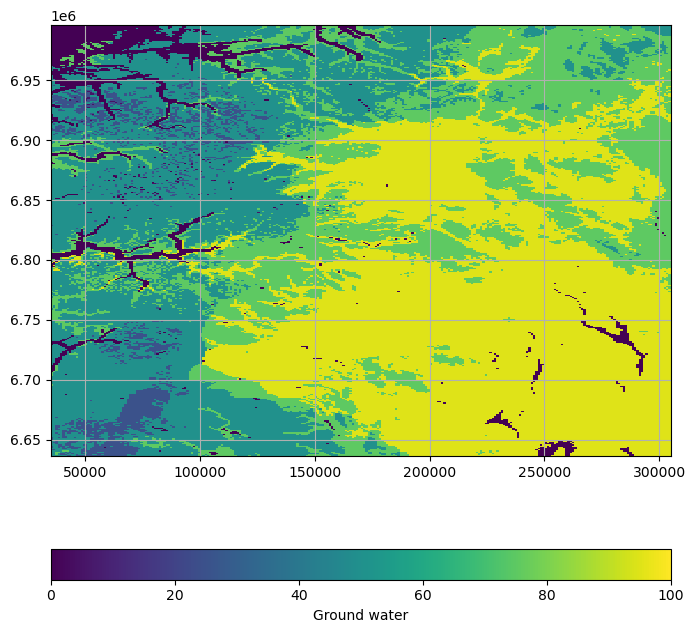

In [97]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx_gw, yy_gw, groundwater, vmax=100)#, cmap='viridis')
plt.colorbar(orientation='horizontal', label='Ground water')
plt.grid()
plt.show()

### plot precipitation

In [46]:
xx_p, yy_p = np.meshgrid(precip['x'], precip['y'])

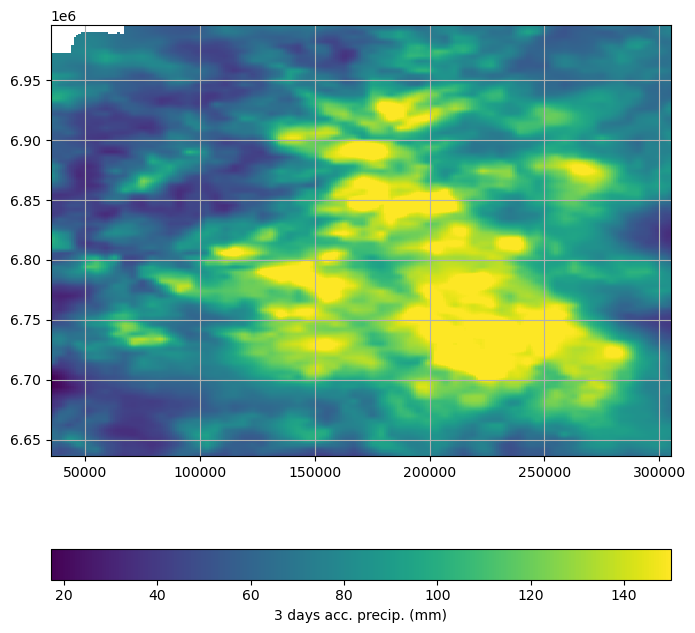

In [44]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx_p, yy_p, precip, vmax=150, cmap='viridis')
plt.colorbar(orientation='horizontal', label='3 days acc. precip. (mm)')
plt.grid()
plt.show()

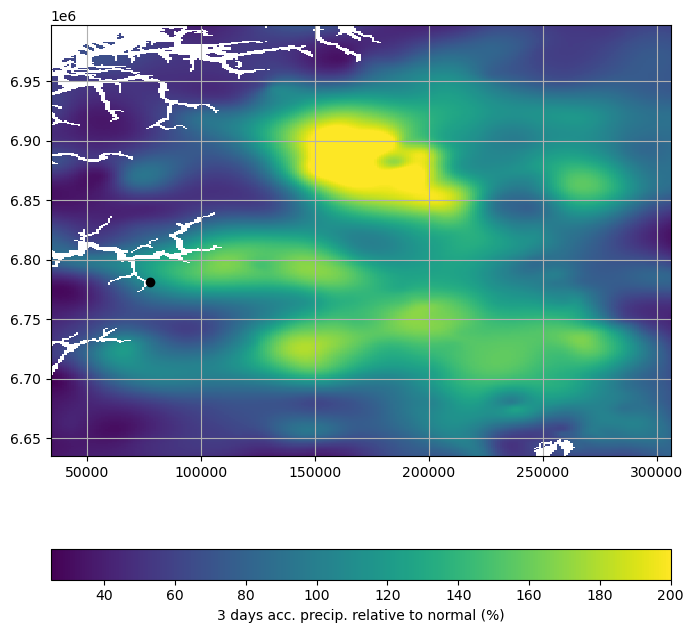

In [57]:
plt.figure(figsize=(8, 8))
plt.pcolormesh(xx_p, yy_p, relprecip['relprecip'], vmax=200, cmap='viridis')
plt.colorbar(orientation='horizontal', label='3 days acc. precip. relative to normal (%)')
plt.scatter(landslide_points.iloc[18]['x'], landslide_points.iloc[18]['y'], marker='o', facecolor='k')
plt.grid()
plt.show()